In [1]:
import pandas as pd
import matplotlib.pylab as plt
plt.style.use('ggplot')
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

In [2]:
df = pd.read_csv('data/BenchmarkingSample20230607.csv')
df

,Unit,Period,Days,Account,Amount
0,00040302CD88,1,30,Sales,89952
1,00040302CD88,2,31,Sales,90594
2,00040302CD88,3,30,Sales,81909
3,00040302CD88,4,31,Sales,87418
4,00040302CD88,5,31,Sales,91109
...,...,...,...,...,...
6043,0004030BEB57,20,30,Other Non-controllables,1455
6044,0004030BEB57,21,31,Other Non-controllables,7456
6045,0004030BEB57,22,31,Other Non-controllables,2037
6046,0004030BEB57,23,28,Other Non-controllables,2037


In [3]:
# Make a new df with just negative values
dfn = df[df['Amount'] < 0].copy()
dfn

,Unit,Period,Days,Account,Amount
745,00040302D006,2,31,Crew Labor,-46
746,00040302D006,3,30,Crew Labor,-1394
1396,00040302D006,5,31,Other Labor-related Costs,-513
2168,00040302CD88,9,31,Promotion,-303
2172,00040302CD88,13,30,Promotion,-114
...,...,...,...,...,...
5964,00040302D014,13,30,Other Non-controllables,-2116
5988,0004030A635E,13,30,Other Non-controllables,-5470
6012,0004030B92EE,13,30,Other Non-controllables,-3232
6022,0004030B92EE,23,28,Other Non-controllables,-725


## Data Understanding

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6048 entries, 0 to 6047
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Unit     6048 non-null   object
 1   Period   6048 non-null   int64 
 2   Days     6048 non-null   int64 
 3   Account  6048 non-null   object
 4   Amount   6048 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 236.4+ KB


In [5]:
# reshape df
unmelt = df.pivot_table(index=['Unit', 'Period', 'Days'], columns='Account', values='Amount', aggfunc='sum')
unmelt = unmelt.reset_index()
unmelt

Account,Unit,Period,Days,Advertising,Cost of Sales - Food,Cost of Sales - Paper,Crew Labor,Maintenance & Repair,Management Labor,Other Controllables,Other Labor-related Costs,Other Non-controllables,Outside Services,Promotion,Rent,Sales,Utilities
0,00040302CD88,1,30,3778,20557,2190,486,5135,3983,3167,3429,7879,8462,401,-610,89952,5690
1,00040302CD88,2,31,3805,20876,2058,1376,1553,4255,3899,3699,7918,5329,445,-178,90594,4917
2,00040302CD88,3,30,3440,19531,2291,178,2321,4241,3646,3614,7471,5062,553,-527,81909,4692
3,00040302CD88,4,31,3672,20999,2056,36597,3412,5515,2581,6944,7537,5967,874,-353,87418,5699
4,00040302CD88,5,31,3827,21357,2312,29942,3345,5484,3772,7109,6385,5727,635,-167,91109,5109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,0004030BEB57,20,30,15729,99236,10557,75243,8789,3997,2729,15678,26672,11476,-3,64375,374497,6230
212,0004030BEB57,21,31,12227,108507,13137,94509,1704,4989,6187,15246,39347,16172,-1144,81337,424685,6480
213,0004030BEB57,22,31,15255,101713,10812,82894,3256,4278,4408,16168,28140,11189,2665,58308,363205,8236
214,0004030BEB57,23,28,15020,98547,11558,83338,3605,5253,3443,16454,27999,10646,608,56786,357611,2656


In [6]:
unmelt.value_counts()

Unit          Period  Days  Advertising  Cost of Sales - Food  Cost of Sales - Paper  Crew Labor  Maintenance & Repair  Management Labor  Other Controllables  Other Labor-related Costs  Other Non-controllables  Outside Services  Promotion  Rent    Sales   Utilities
00040302CD88  1       30    3778         20557                 2190                   486         5135                  3983              3167                 3429                       7879                     8462              401        -610    89952   5690         1
0004030A635E  5       31    22389        113432                12331                  113657      5145                  7148              7250                 24822                      33719                    7357              1172        96502  533084  7738         1
00040302D014  18      30    9700         59849                 6351                   48983       3670                  7110              901                  9960                       20113 

In [7]:
unmelt.describe()

Account,Period,Days,Advertising,Cost of Sales - Food,Cost of Sales - Paper,Crew Labor,Maintenance & Repair,Management Labor,Other Controllables,Other Labor-related Costs,Other Non-controllables,Outside Services,Promotion,Rent,Sales,Utilities
count,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000,216.000000
mean,12.500000,30.416667,10232.944444,59979.949074,6657.981481,54913.486111,3831.439815,5509.726852,3710.106481,11412.055556,18857.587963,7741.518519,674.166667,31404.675926,247696.004630,6146.652778
std,6.938266,0.864009,5709.846541,32676.102087,3482.848365,28617.832353,1800.365807,2028.192336,1491.865569,5646.204915,8737.498027,3498.089877,641.844993,31797.739017,137009.910575,2409.998783
min,1.000000,28.000000,1860.000000,9850.000000,779.000000,-1394.000000,828.000000,309.000000,901.000000,1556.000000,6112.000000,1302.000000,-2087.000000,-14050.000000,44281.000000,1030.000000
25%,6.750000,30.000000,5577.000000,34888.250000,4035.000000,36567.000000,2356.750000,4094.000000,2640.000000,7425.000000,12025.500000,4868.500000,365.000000,594.500000,133278.750000,4855.500000
50%,12.500000,31.000000,9667.500000,56010.500000,6356.500000,51521.000000,3571.500000,5080.500000,3455.500000,10530.000000,17615.000000,7702.000000,621.500000,26641.000000,230945.500000,6269.500000
75%,18.250000,31.000000,13685.250000,82223.500000,8935.250000,75440.000000,4893.000000,6961.250000,4604.250000,15020.250000,24019.750000,10029.750000,965.500000,56851.000000,337484.500000,7796.000000
max,24.000000,31.000000,23049.000000,147381.000000,15690.000000,121605.000000,10831.000000,16581.000000,8828.000000,25839.000000,41028.000000,19983.000000,3574.000000,111586.000000,573462.000000,14096.000000


## Feature Relationships

Scatterplot, heatmap correlation, pairplot and groupby comparisons

In [8]:
# Scatter plot
# sns.scatterplot(x= ,y= ,data= )
# sns.pairplot()

/Users/aaditkamat/Desktop/Projects/QMB6945-RMS-Project/venv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


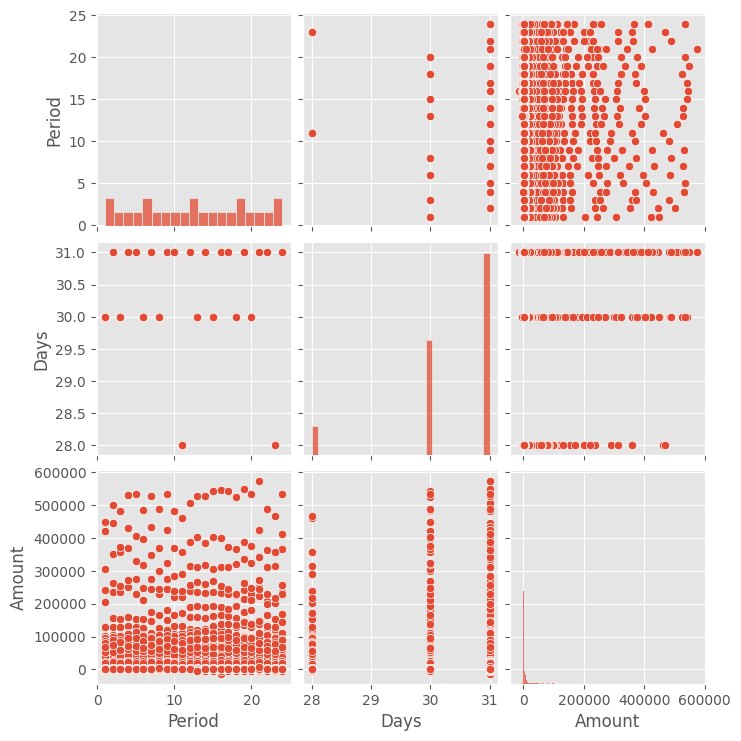

In [9]:
sns.pairplot(df)

/Users/aaditkamat/Desktop/Projects/QMB6945-RMS-Project/venv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


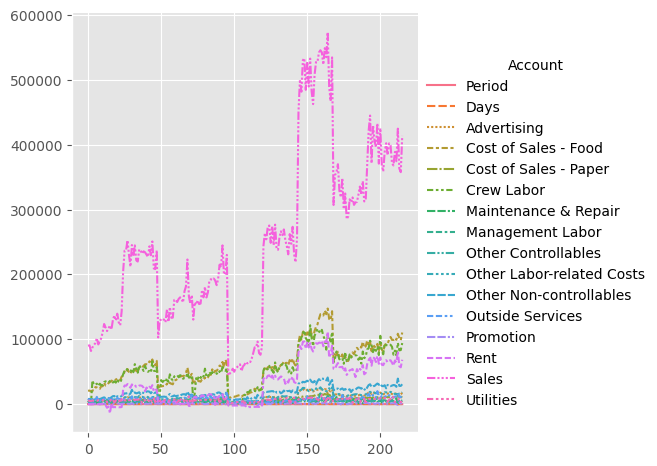

In [10]:
# sns.relplot(x='Period', y='Amount', col='Account', hue='Unit', data=df, col_wrap=4)
sns.relplot(data=unmelt, kind='line')

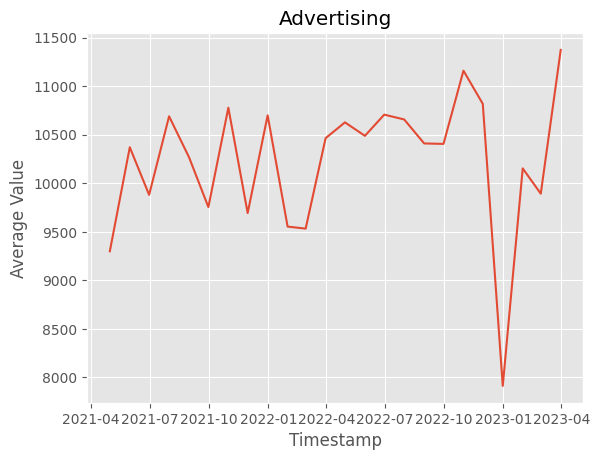

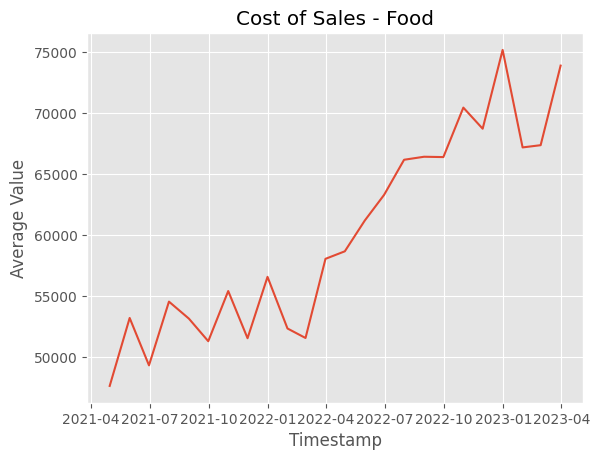

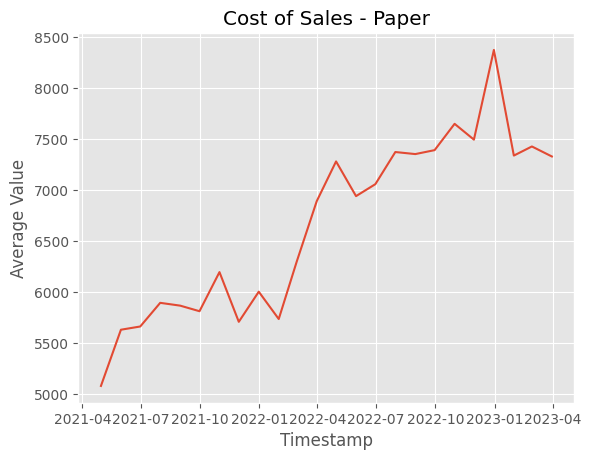

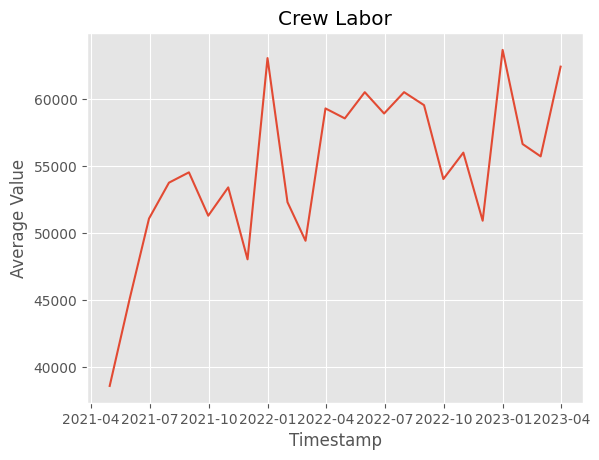

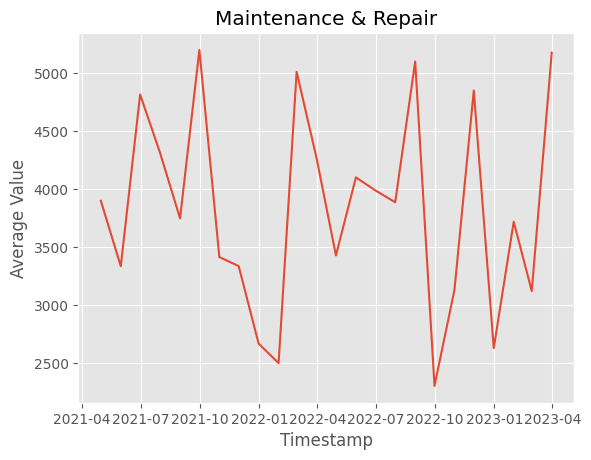

...

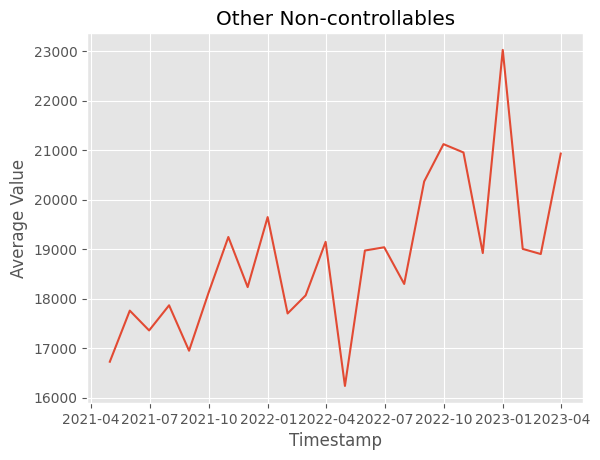

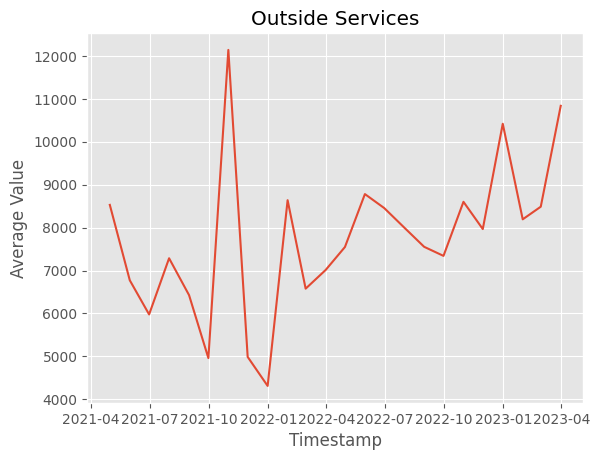

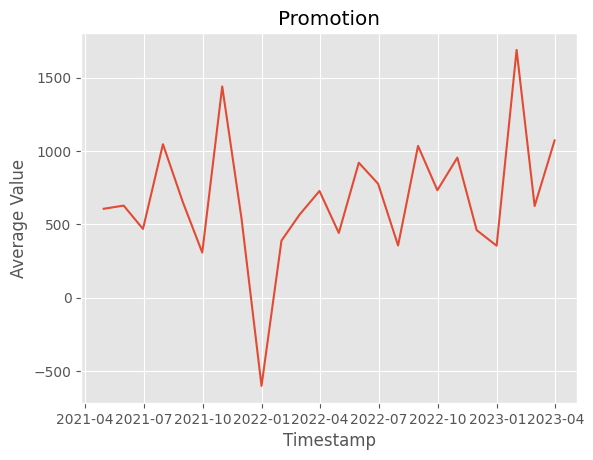

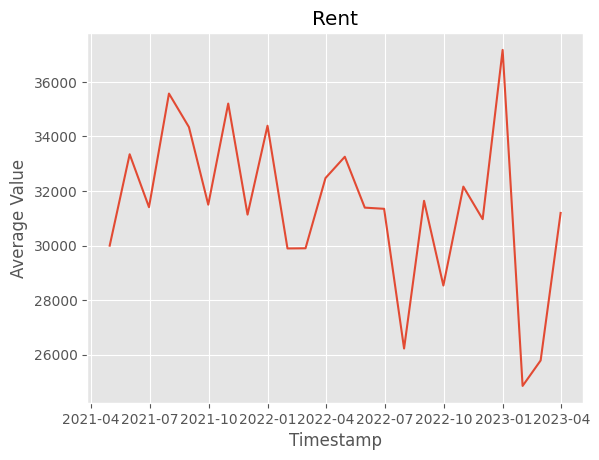

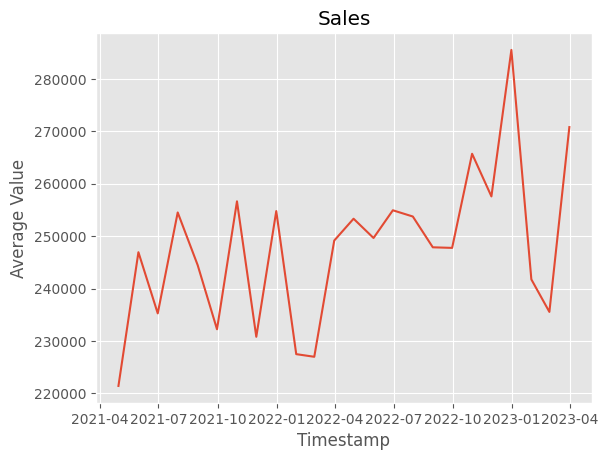

In [11]:
# Make a line chart of the average amount in each account over the dataset
account_columns = unmelt.columns[3:16]

# Convert the 'Days' column to datetime format
dates = pd.date_range(start='4/1/2021', periods=unmelt['Period'].max(), freq='M')
unmelt['Date'] = dates.array[unmelt['Period'] - 1]

# Iterate over the account columns
for account in account_columns:
    # Calculate the average value for each period and account
    account_avg = unmelt.groupby('Date')[account].mean()

    # Create the line chart
    plt.plot(account_avg.index, account_avg.values)

    # Set the title and labels
    plt.title(f'{account}')
    plt.xlabel('Timestamp')
    plt.ylabel('Average Value')

    # Display the chart
    plt.show()

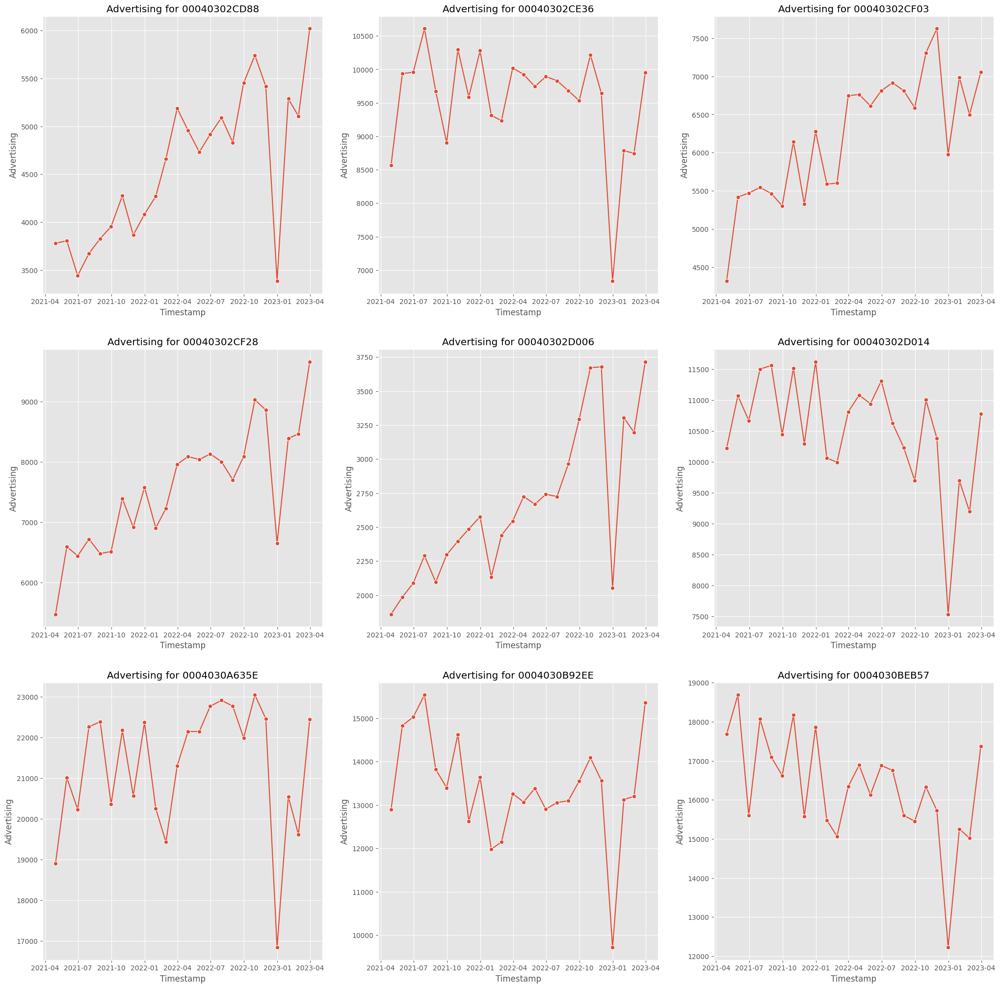

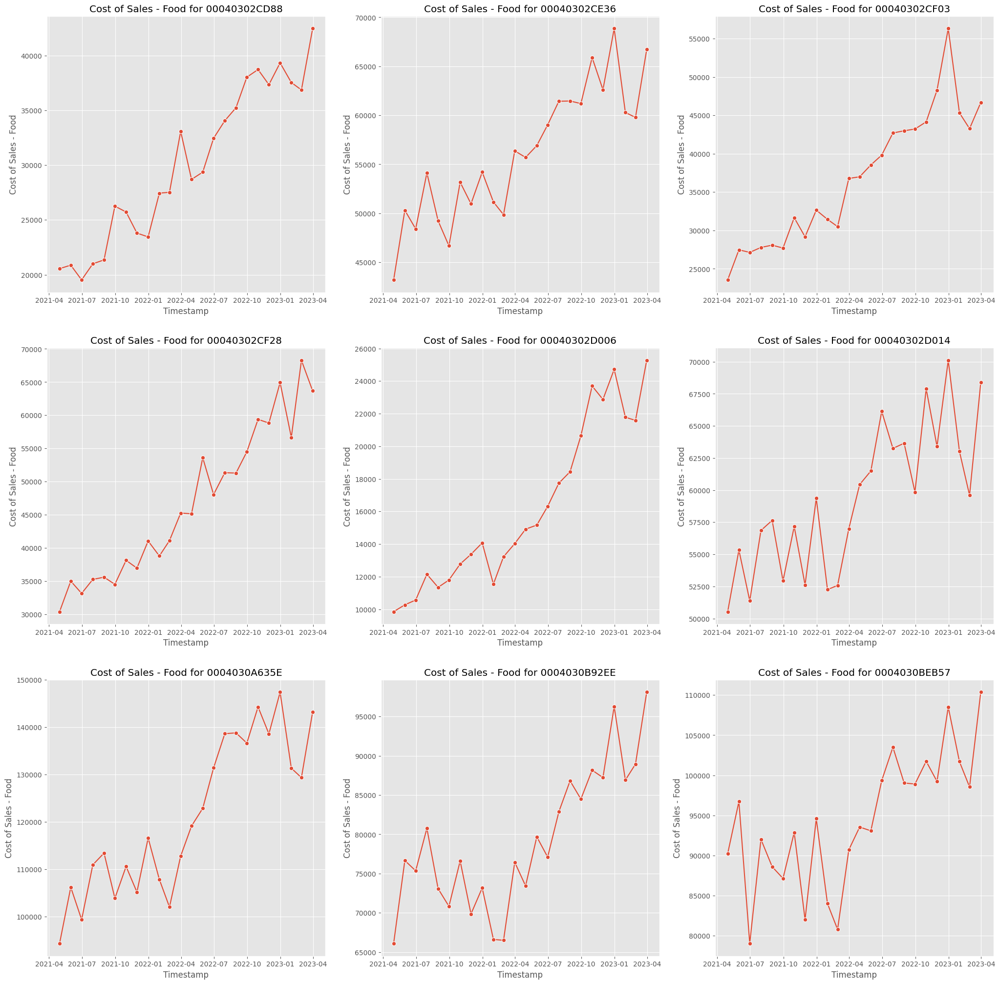

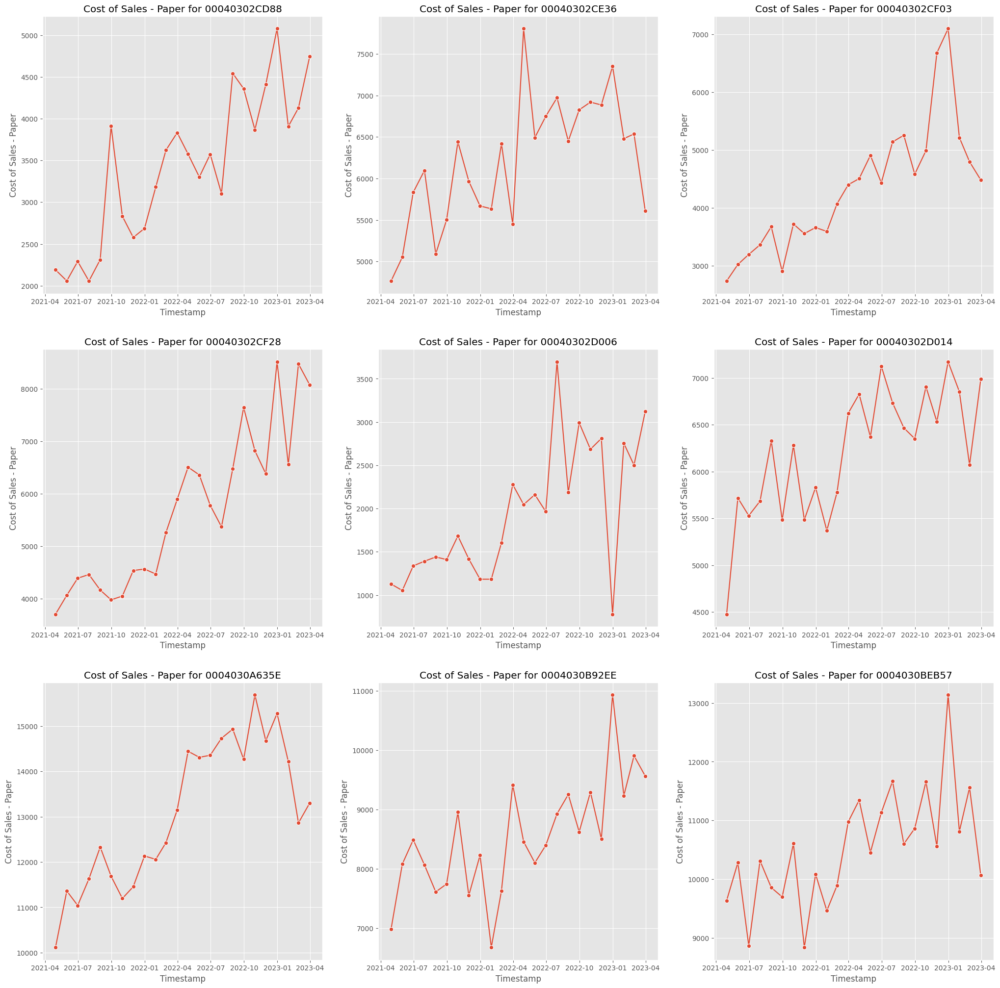

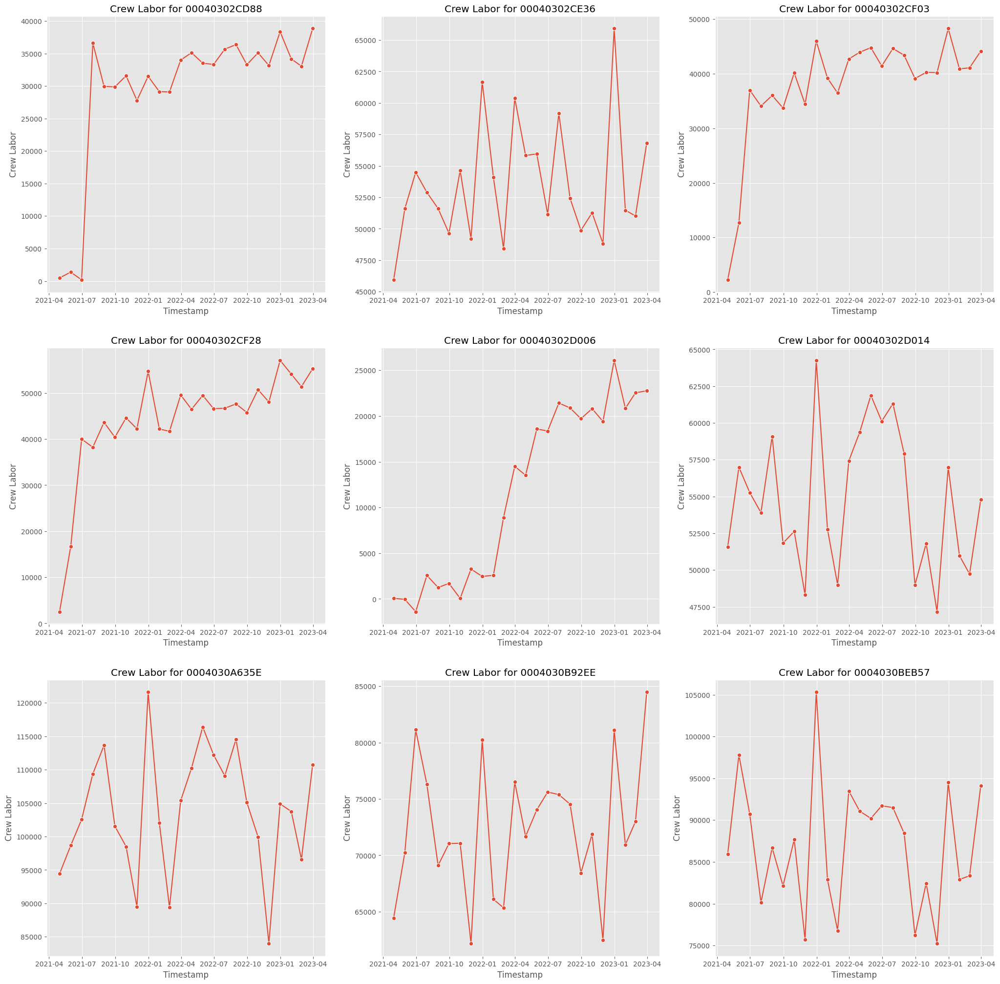

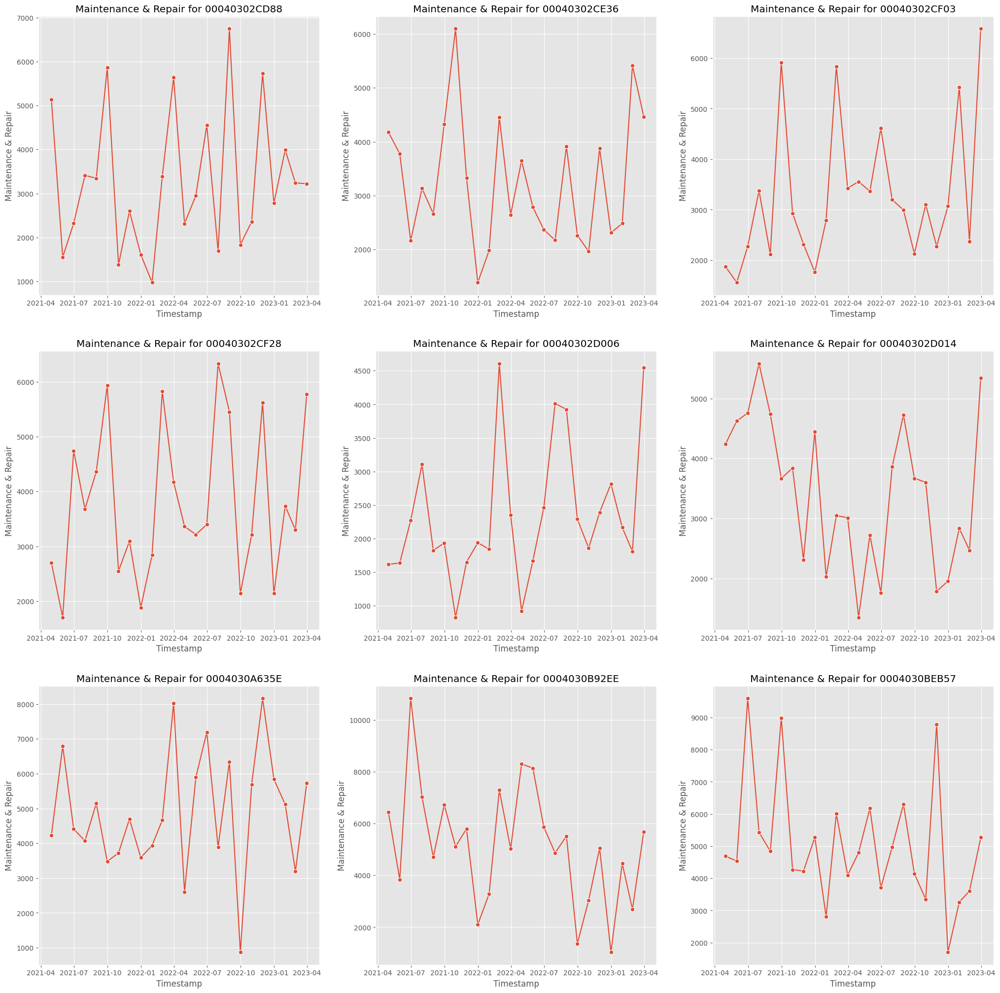

...

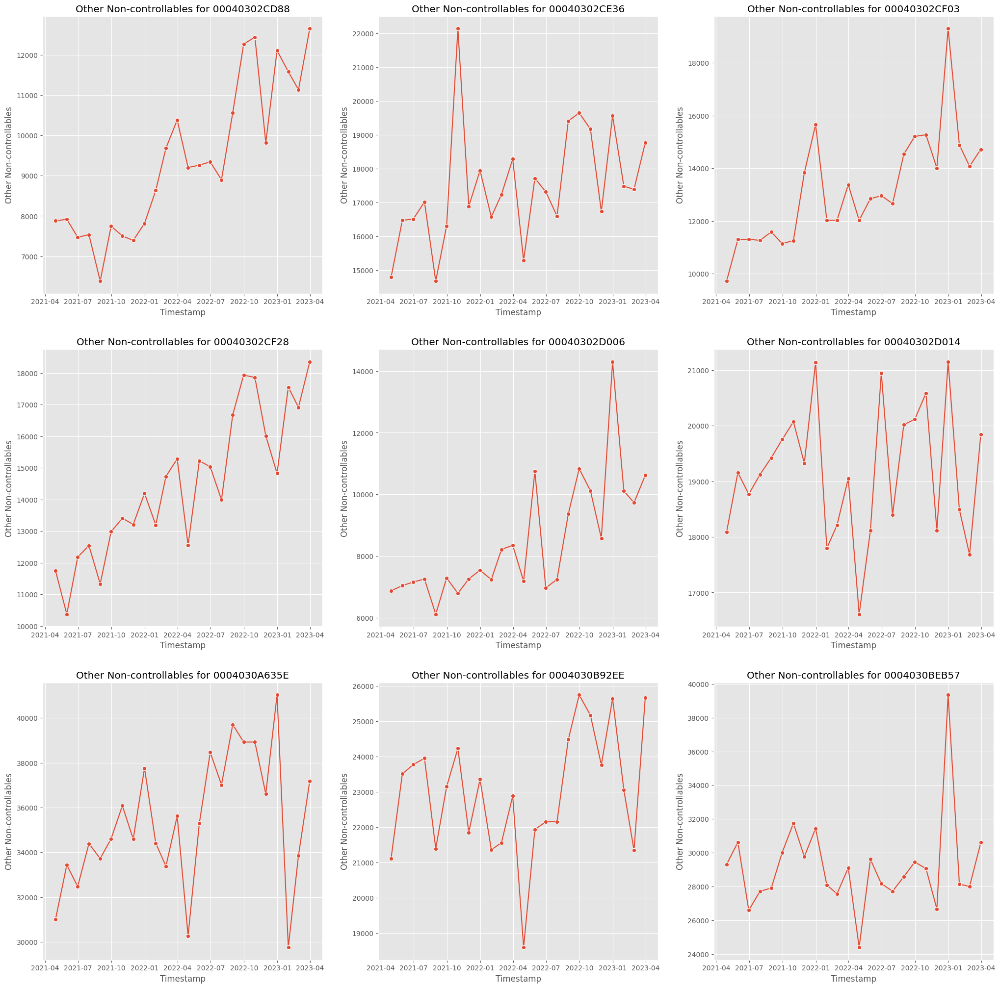

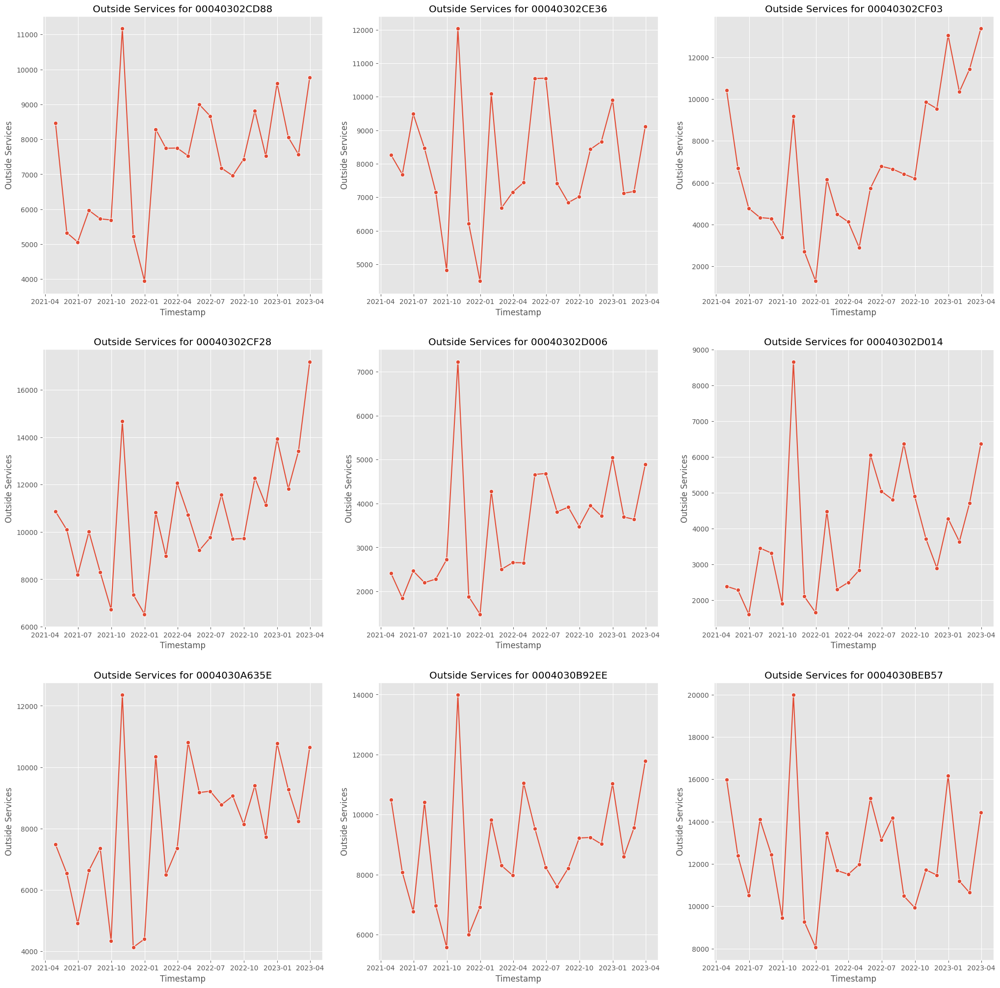

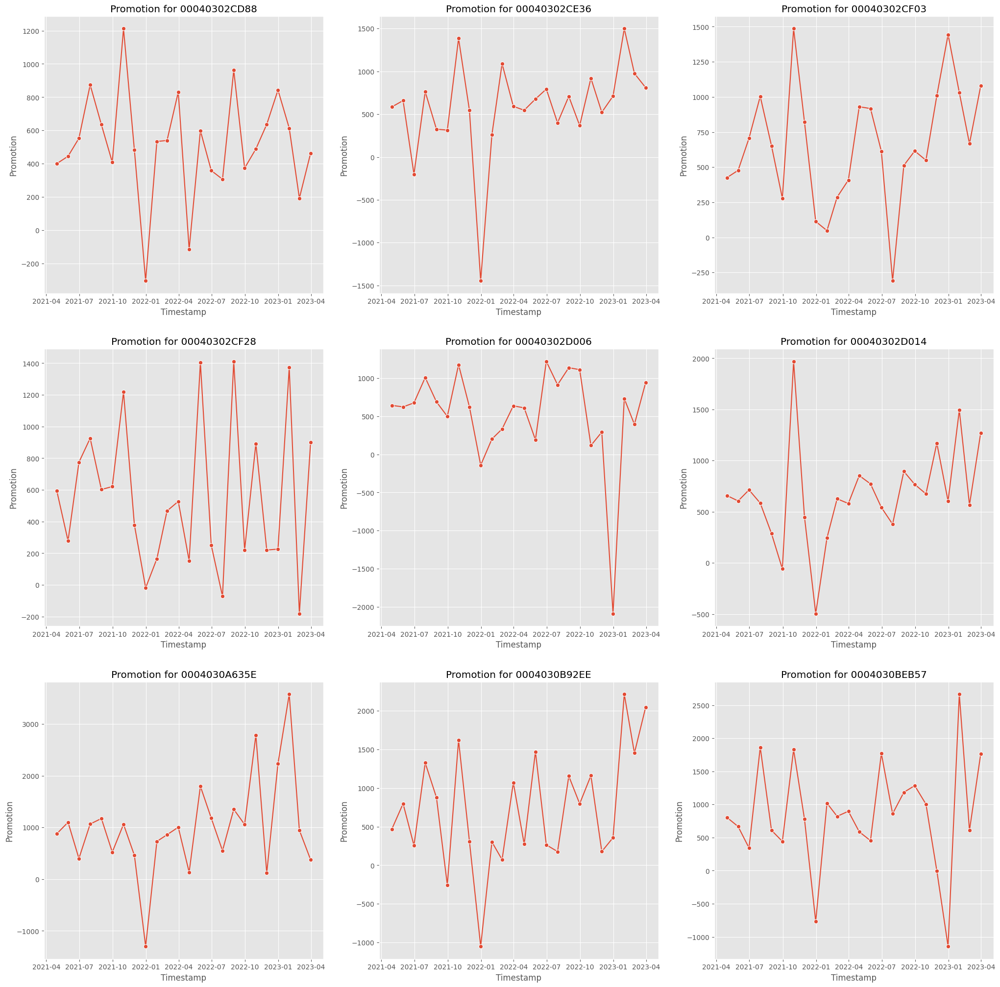

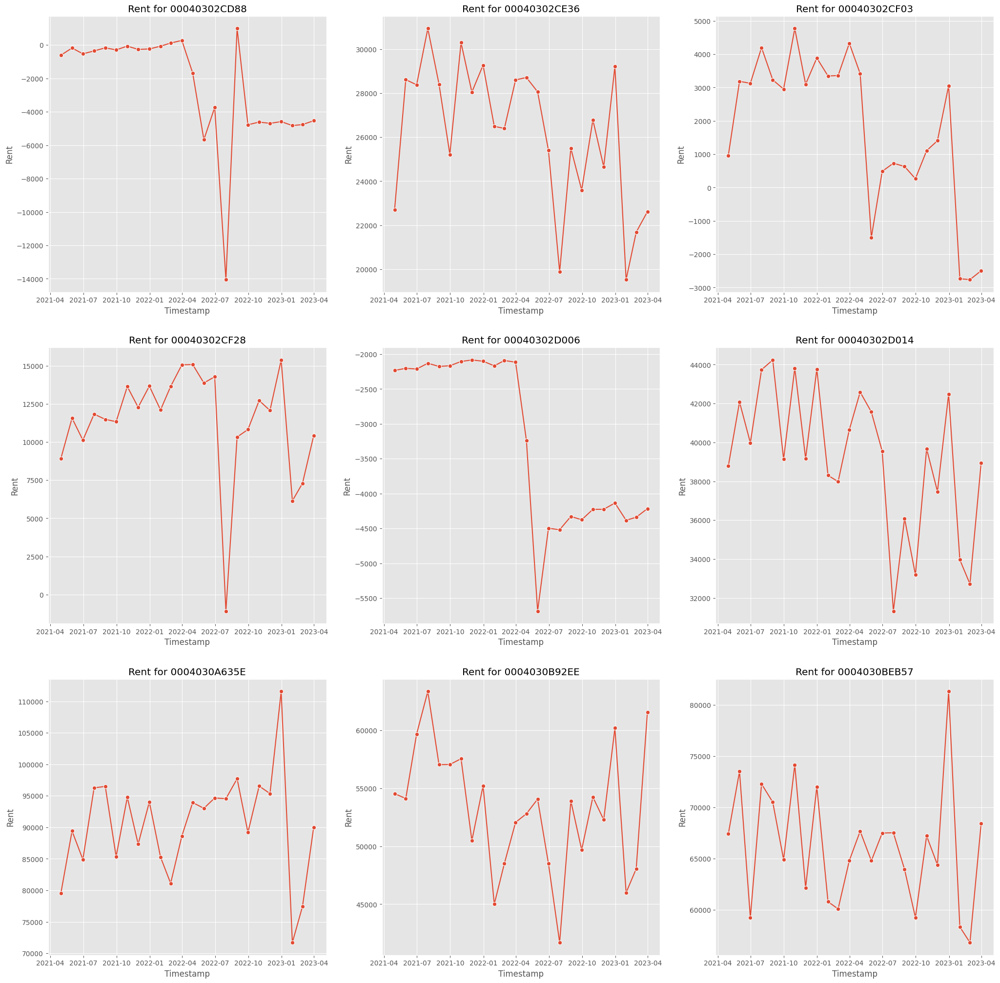

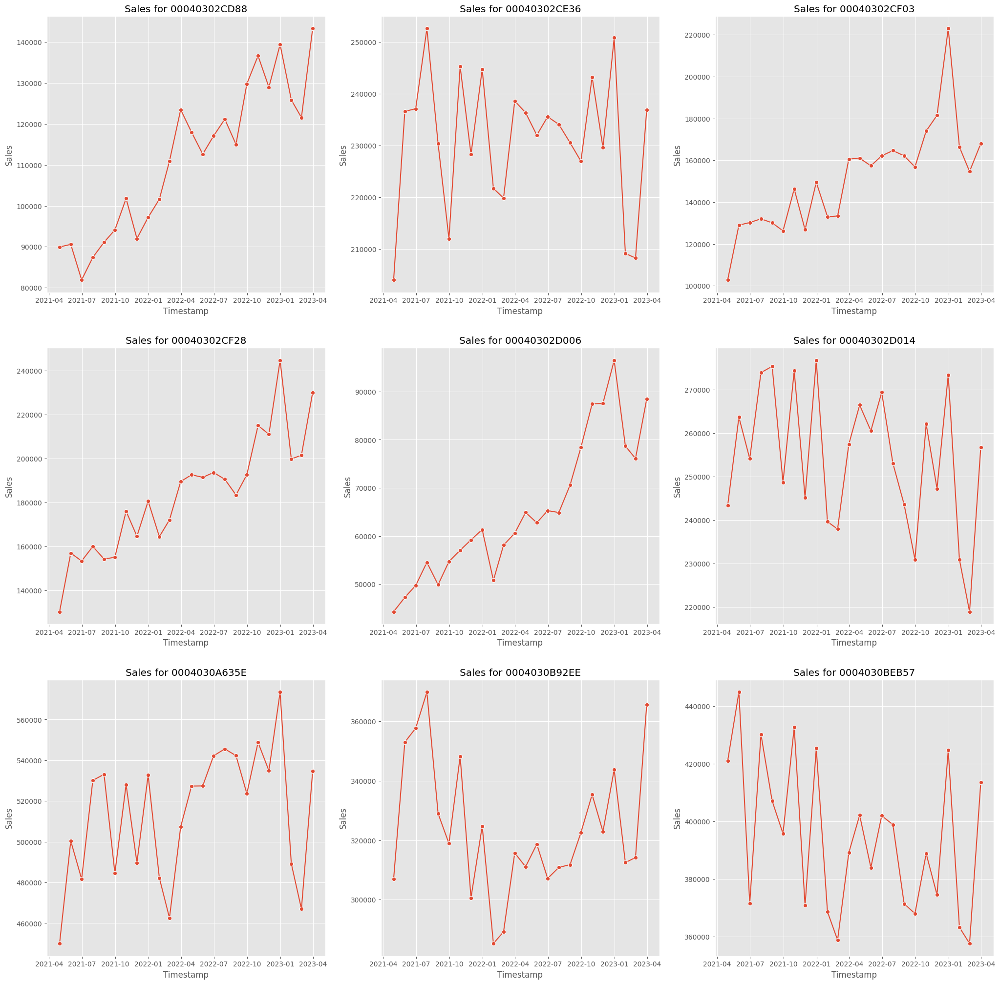

In [12]:
# Make a line chart of the amount in each account over the dataset
account_columns = unmelt.columns[3:16]

# Iterate over the account columns
for account in account_columns:
    # Pivot the data for the current account
    account_data = unmelt.pivot(index='Date', columns='Unit', values=account)
    units = account_data.columns

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(25, 25))
    for idx, unit in enumerate(units):
        # Create the line chart
        sns.lineplot(x=account_data[unit].index, y=account_data[unit], marker='o', ax=axes[idx // 3][idx % 3])
        
        # Set the title and labels
        axes[idx // 3][idx % 3].set_title(f'{account} for {unit}')
        axes[idx // 3][idx % 3].set_xlabel('Timestamp')
        axes[idx // 3][idx % 3].set_ylabel(account)
        
    # Display the chart
    plt.show()

In [13]:
# Determine if a time series is stationary using the ADF test
def is_stationary(time_series):
    result = adfuller(time_series)
    return result[1] <= 0.05

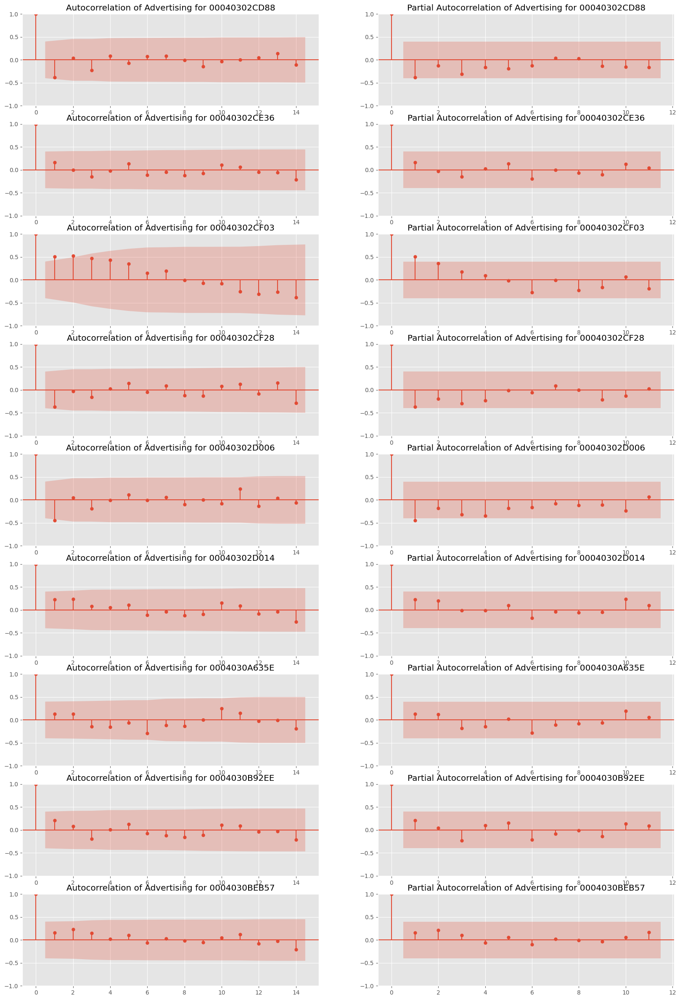

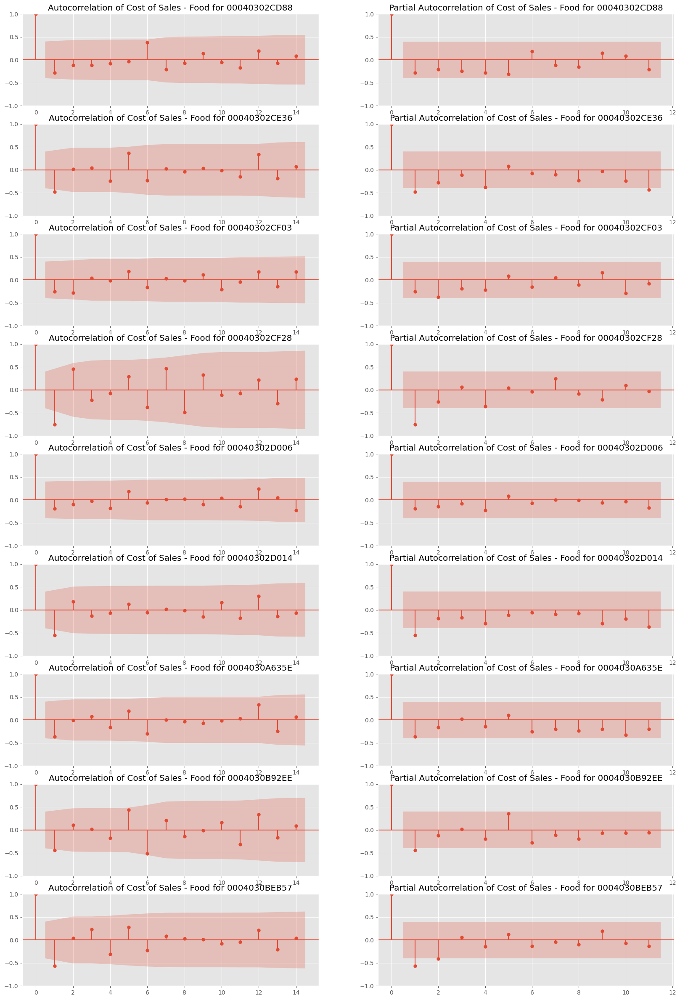

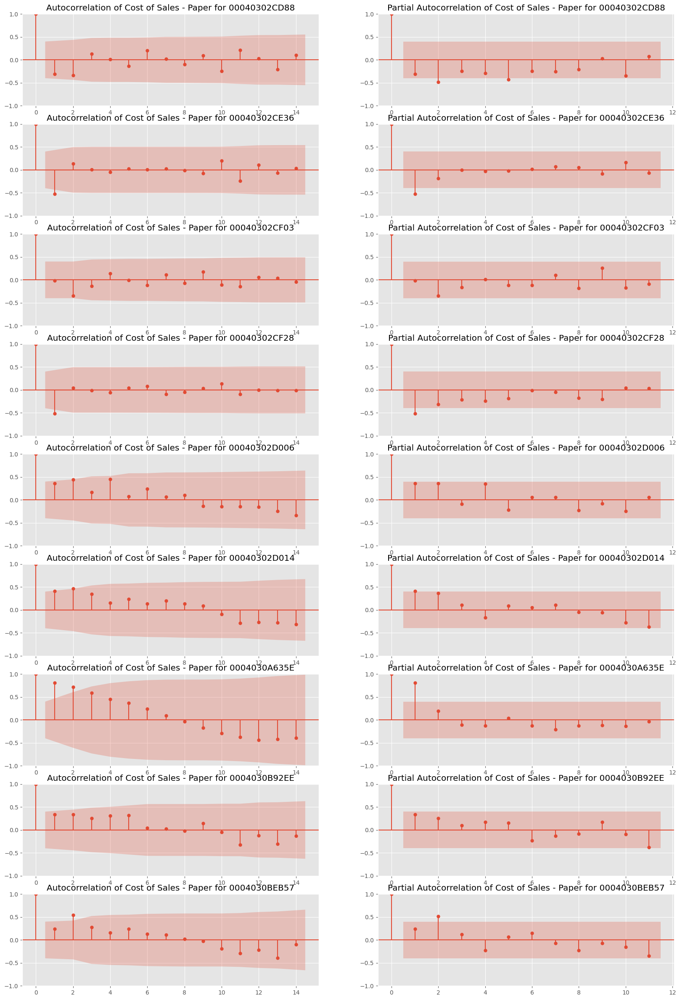

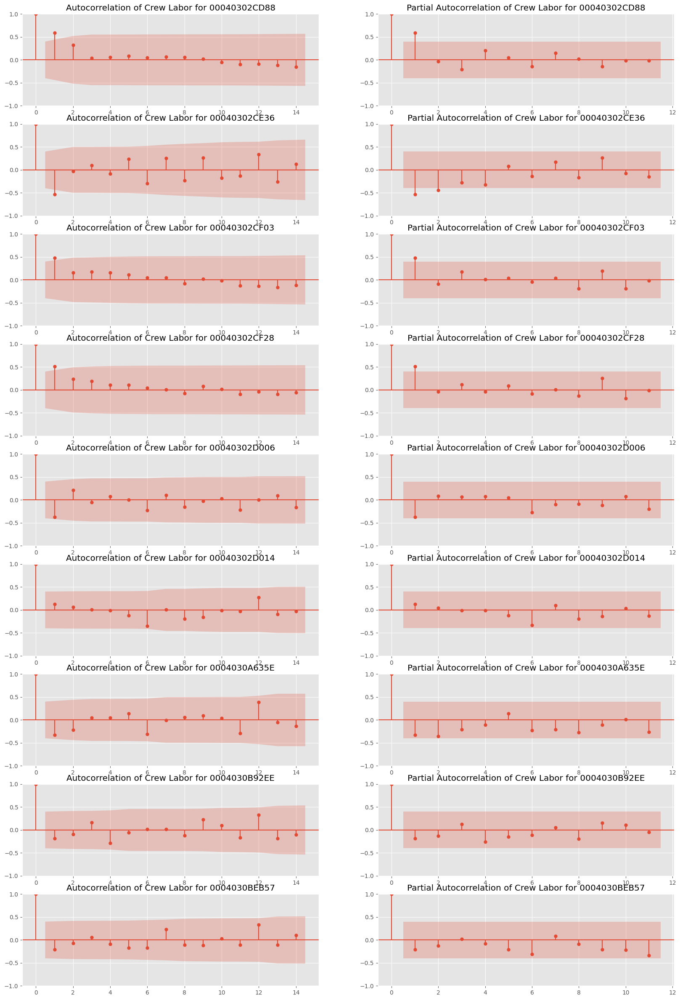

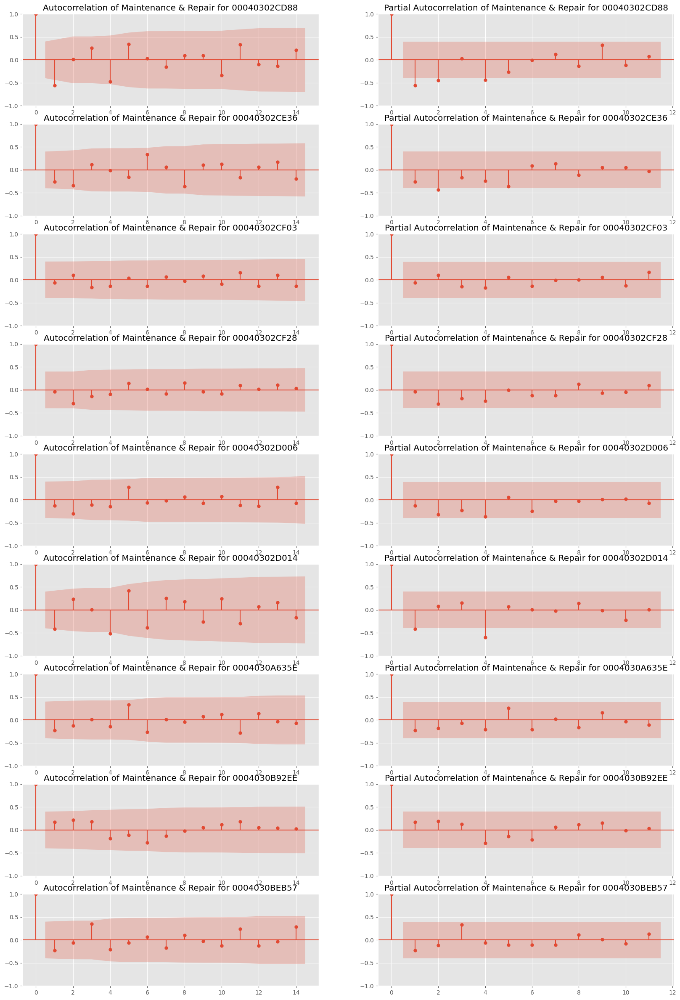

...

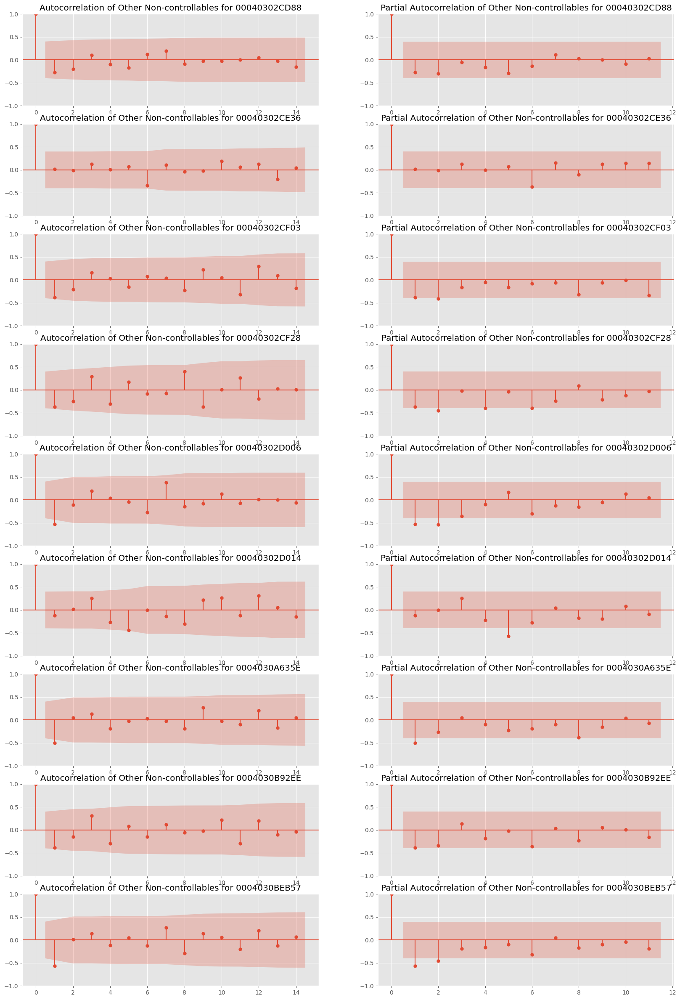

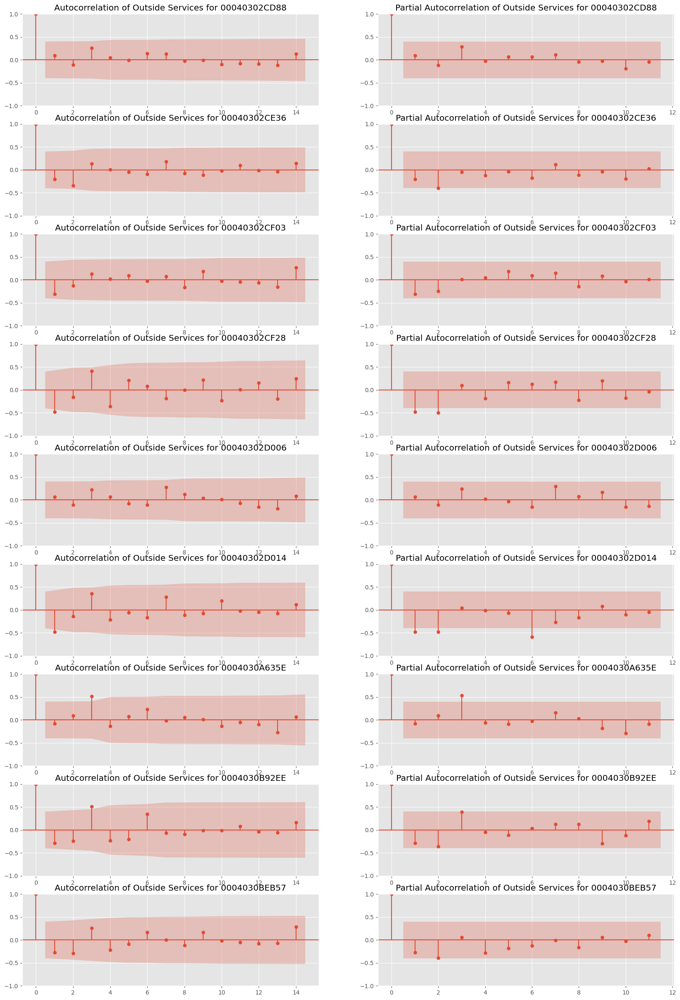

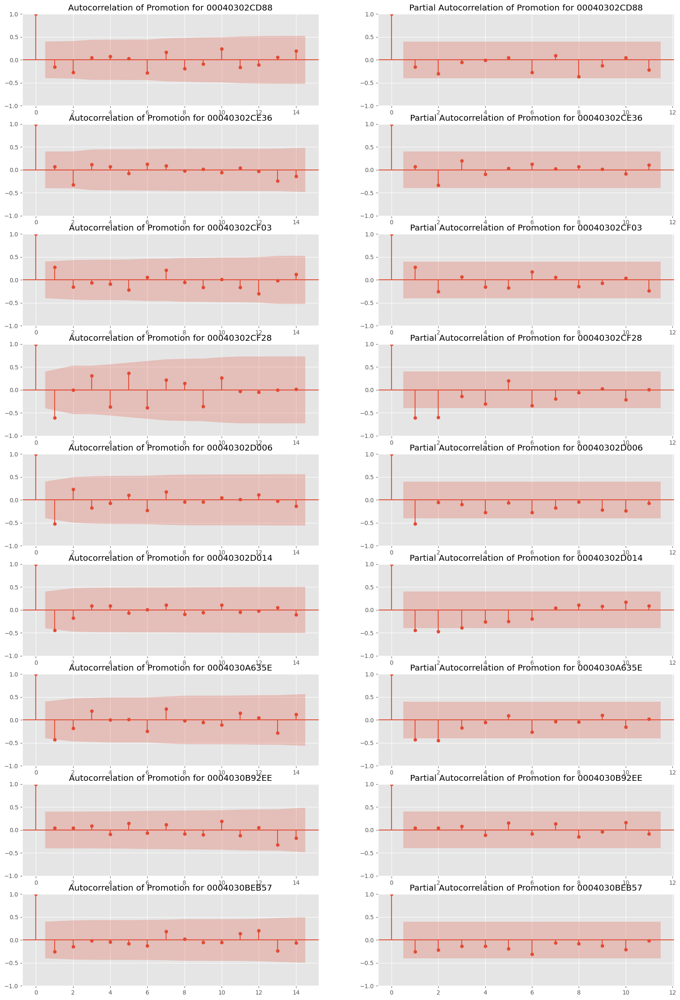

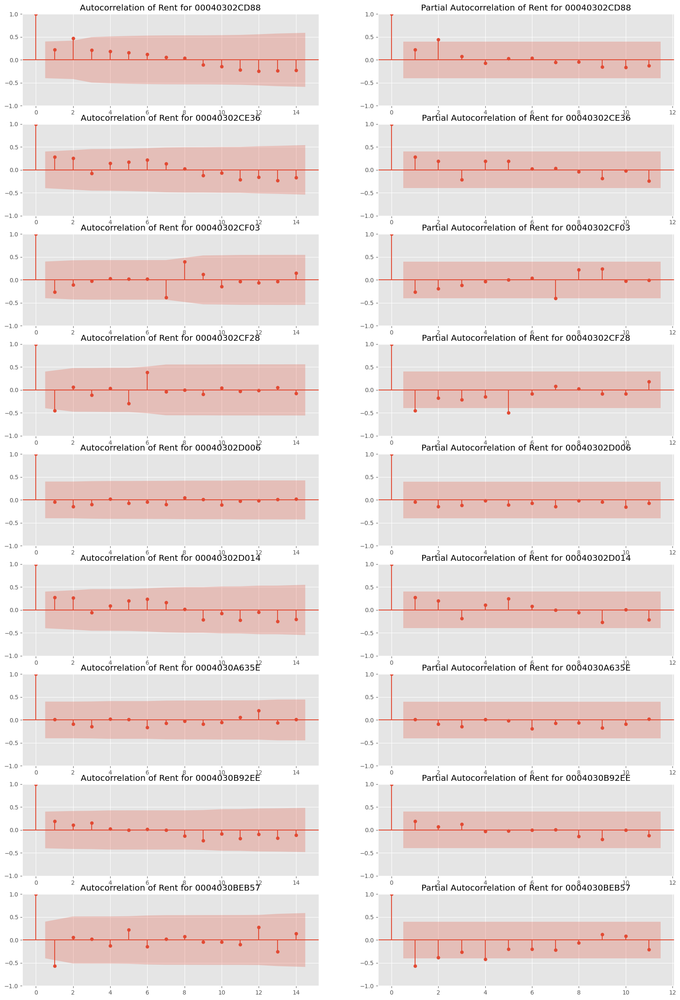

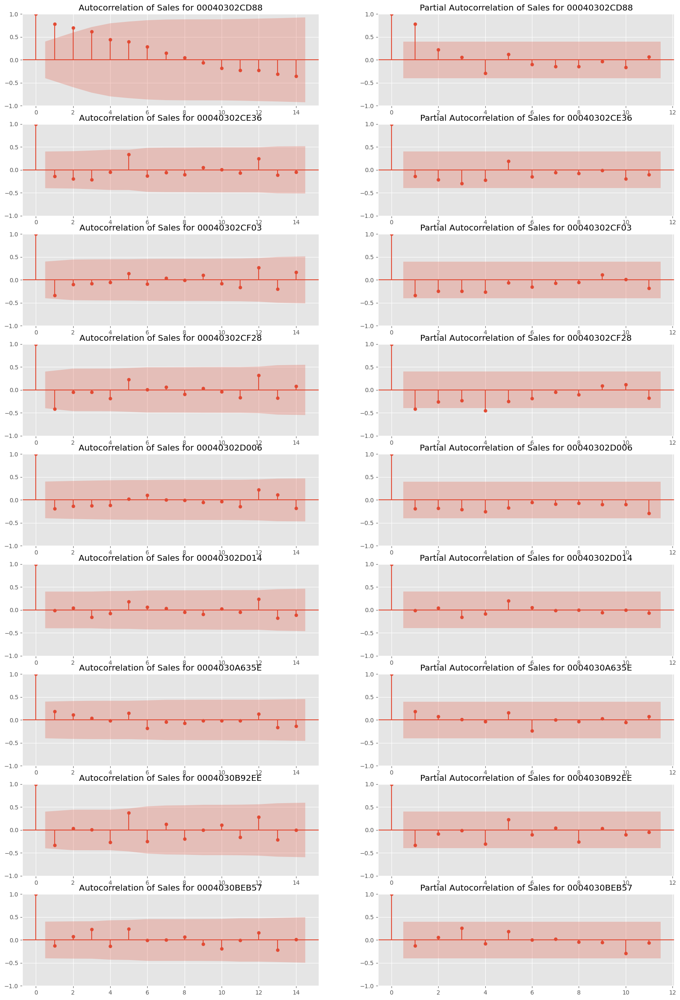

In [19]:
# Iterate over the account columns
from statsmodels.graphics.tsaplots import plot_acf
for account in account_columns:
    # Pivot the data for the current account
    account_data = unmelt.pivot(index='Date', columns='Unit', values=account)
    units = account_data.columns

    fig, axes = plt.subplots(nrows=len(units), ncols=2, figsize=(20, 30))
    for idx, unit in enumerate(units):
        if not is_stationary(account_data[unit]):
            account_data[unit] = account_data[unit].diff().fillna(0)
        plot_acf(account_data[unit], ax=axes[idx][0], title=f'Autocorrelation of {account} for {unit}')
        plot_pacf(account_data[unit], ax=axes[idx][1], title=f'Partial Autocorrelation of {account} for {unit}', lags=11)
        
    # Display the chart
    plt.show()

        

In [ ]:
# Do corr matrix of columns across firms
# Select only account column
account_columns = unmelt.columns[3:16]
# Make correlation matrix
corrm1 = unmelt[account_columns].corr()
# Create heatmap
sns.heatmap(corrm1, annot=True, cmap='coolwarm')
# Title
plt.title('Correlation overall')
plt.show()

In [ ]:
account_columns = unmelt.columns[3:16]
units = unmelt['Unit'].unique()
num_units = len(units)

# Calculate the number of rows and columns for subplots
num_rows = num_units
num_cols = 1

# Create subplots for each unit
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(8, 5 * num_units))

# Iterate over the units and create a heatmap for each unit
for i, unit in enumerate(units):
    unit_df = unmelt[unmelt['Unit'] == unit]
    correlation_matrix = unit_df[account_columns].corr()

    ax = axes[i]
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', ax=ax)
    ax.set_title(f'Correlation Matrix - Unit {unit}')

# Adjust the layout of subplots
plt.tight_layout()

# Show the plot
plt.show()